## NeurIPS Viz Connectomes

### Imports

In [7]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
from env.imports import *

In [9]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

#### Check job specs

In [10]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 0.0%
RAM Usage: 4.5%
Available RAM: 962.1G
Total RAM: 1007.0G
52.4G


In [11]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 0


### Data viz

In [12]:
from data.data_load import load_transcriptome, load_connectome, load_coords, load_network_labels
from data.data_viz import plot_connectome, plot_transcriptome
from data.data_utils import expand_X_symmetric, expand_Y_symmetric

In [34]:
X = load_transcriptome(parcellation='S400', hemisphere='both', omit_subcortical=False, sort_genes='chromosome', impute_strategy='mirror_interpolate')
Y = load_connectome(parcellation='S400', hemisphere='both', omit_subcortical=False)
coords = load_coords(parcellation='S400', hemisphere='both', omit_subcortical=False)
labels, network_labels = load_network_labels(parcellation='S400', hemisphere='both', omit_subcortical=False)

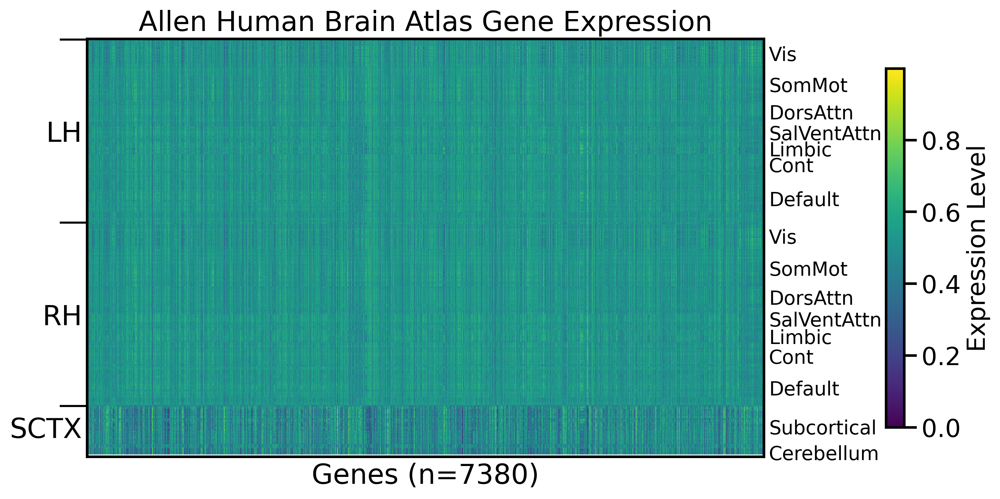

In [14]:
plot_transcriptome(null_model='none', parcellation='S400', hemisphere='both', omit_subcortical=False, gene_list='0.2', sort_genes='ref_genome', impute_strategy='mirror_interpolate') #, add_hemisphere_labels=True, add_network_labels=False)

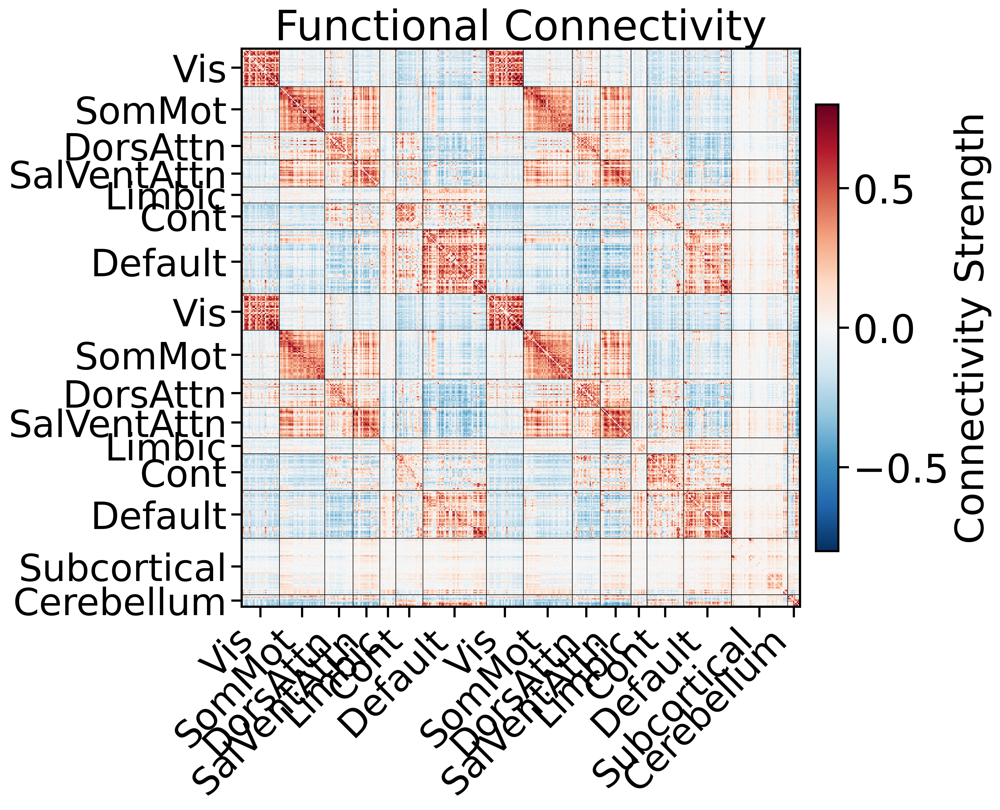

In [21]:
plot_connectome(parcellation='S400', hemisphere='both', measure='FC', omit_subcortical=False, add_network_labels=True, add_hemisphere_labels=False, fontsize=36)

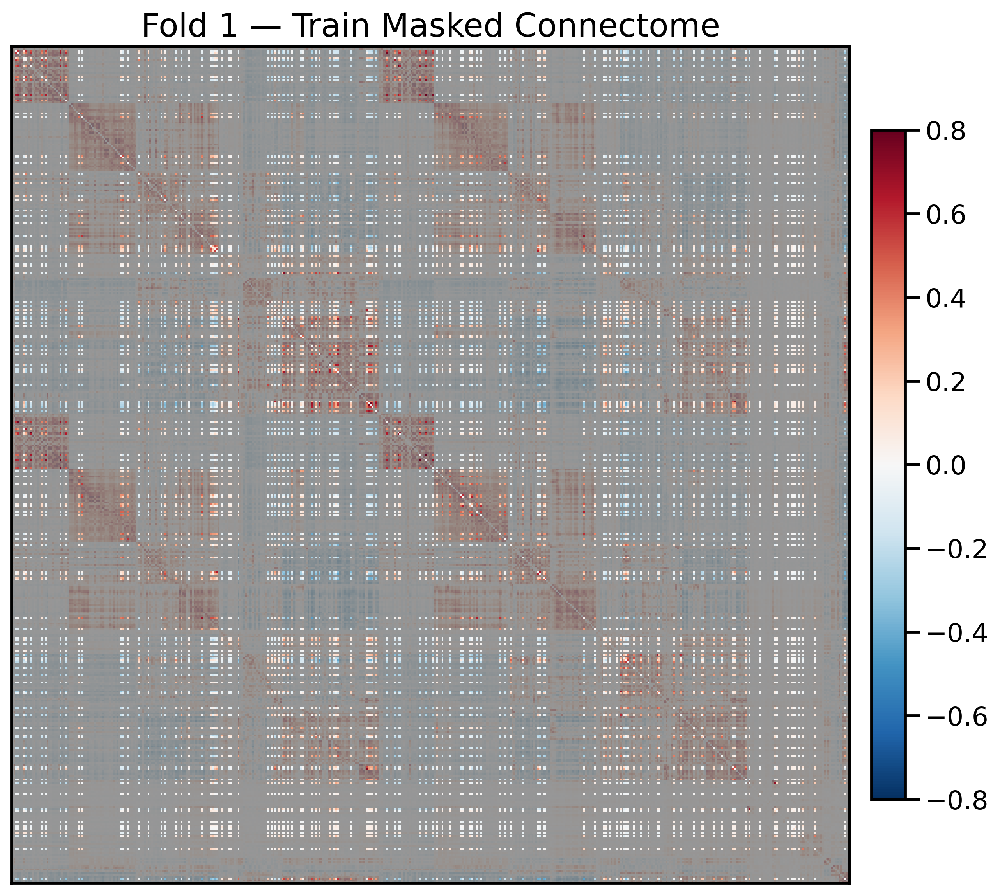

In [30]:
from data.data_viz import plot_train_test_masked_connectome, plot_train_test_reordered_connectome
from data.cv_split import RandomCVSplit

cv = RandomCVSplit(X, Y, num_splits=4, random_seed=42)
splits = list(cv.split())

train_idx, test_idx = splits[1]  # Fold 1 (second split)
plot_train_test_masked_connectome(Y, train_idx, test_idx, measure='FC', title_prefix='Fold 1', mask_set='train', mask_alpha=0.8)

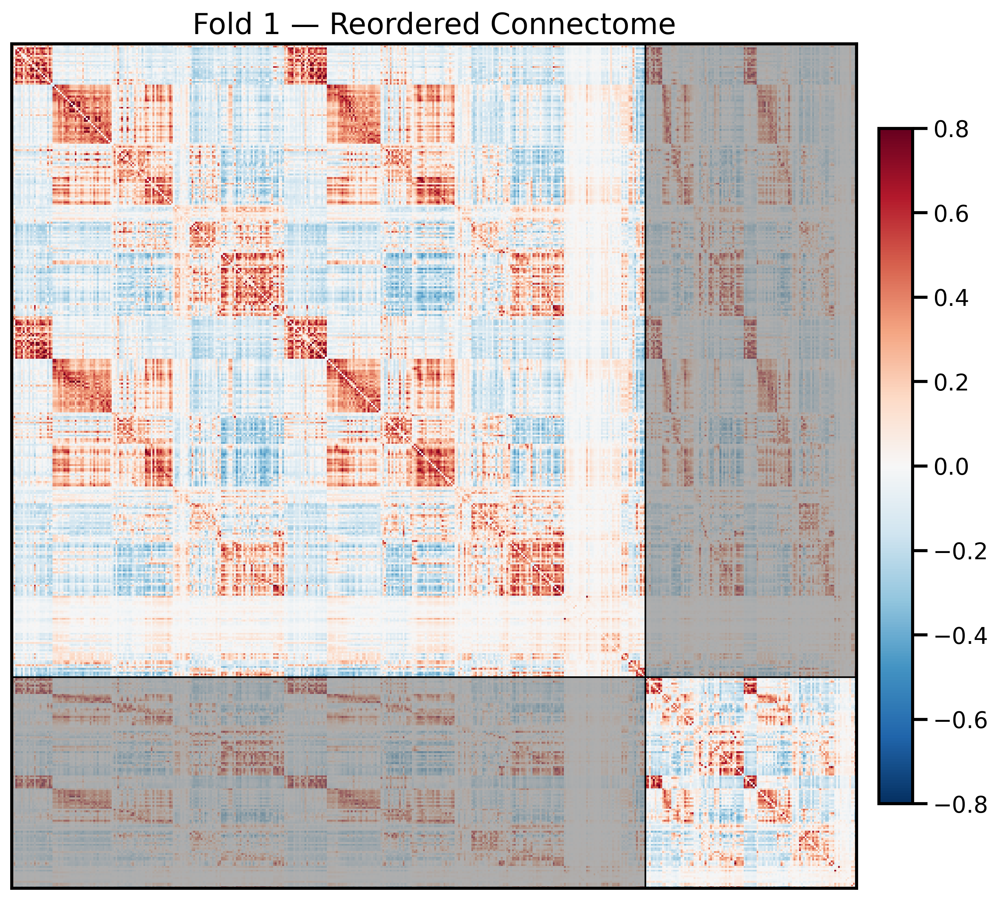

In [32]:
from data.data_viz import plot_train_test_reordered_connectome

# Assume X and Y are already loaded
cv = RandomCVSplit(X, Y, num_splits=4, random_seed=42)
splits = list(cv.split())

# Select the second fold (Fold 1 with 0-based indexing)
train_indices, test_indices = splits[1]

# Plot reordered connectome with transparent masking of train-test edges
plot_train_test_reordered_connectome(
    Y,
    train_indices,
    test_indices,
    measure='FC',
    title_prefix='Fold 1',
    fontsize=18,
    figsize=(10, 8),
    mask_alpha=0.6
)

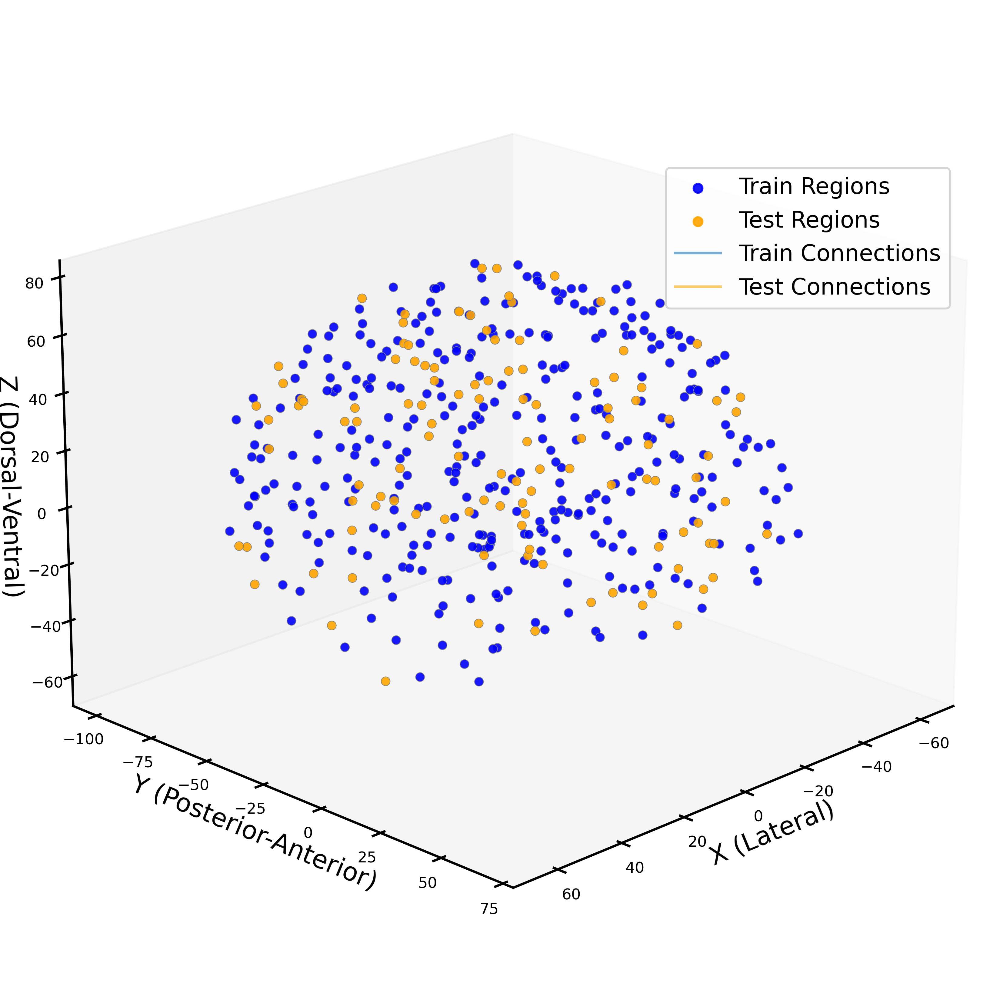

In [38]:
from data.data_viz import visualize_splits_3d

# Assume X, Y, and coords are already defined
# X: (n_regions, n_genes), Y: (n_regions, n_regions), coords: (n_regions, 3)

# Initialize CV splitter
cv = RandomCVSplit(X, Y, num_splits=4, random_seed=42)
splits = list(cv.split())

# Select Fold 1 (second split using 0-indexing)
selected_split = [splits[1]]  # Wrap in list so it matches expected input type

# Call the 3D visualization function
visualize_splits_3d(
    splits=selected_split,
    coords=coords,
    Y=Y,
    X=X,
    valid_genes=None,  # Optional: list of gene names
    #gene_name="LAMA1",        # Optional: specific gene to color nodes by
    title_prefix="Random Fold 1",
    edge_threshold=.9       # Optional: only draw edges with weight > threshold
)